In [1]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report,roc_auc_score,roc_curve
from pandas_profiling import ProfileReport

C:\Users\mdqua\AppData\Local\Temp\ipykernel_9904\3489865271.py:7: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


In [2]:
df = pd.read_csv("winequality_red.csv")

In [3]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [4]:
set(df.quality)

{3, 4, 5, 6, 7, 8}

In [5]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
x = df.drop(columns='quality')

In [7]:
y = df.quality

In [8]:
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [9]:
y

0       5
1       5
2       5
3       6
4       5
       ..
1594    5
1595    6
1596    6
1597    5
1598    6
Name: quality, Length: 1599, dtype: int64

In [10]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.20,random_state=30)

In [11]:
dt = DecisionTreeClassifier()

In [12]:
dt.fit(x_train,y_train)

DecisionTreeClassifier()

In [13]:
import matplotlib.pyplot as plt
from sklearn import tree
%matplotlib inline

[Text(0.5341123923277243, 0.9722222222222222, 'X[10] <= 10.15\ngini = 0.641\nsamples = 1279\nvalue = [8, 39, 547, 510, 160, 15]'),
 Text(0.3189290364583333, 0.9166666666666666, 'X[6] <= 95.5\ngini = 0.51\nsamples = 640\nvalue = [5, 21, 405, 189, 18, 2]'),
 Text(0.20516576522435898, 0.8611111111111112, 'X[9] <= 0.585\ngini = 0.543\nsamples = 553\nvalue = [5, 20, 325, 183, 18, 2]'),
 Text(0.08188100961538461, 0.8055555555555556, 'X[10] <= 9.75\ngini = 0.453\nsamples = 264\nvalue = [2, 14, 185, 61, 2, 0]'),
 Text(0.039162660256410256, 0.75, 'X[8] <= 3.545\ngini = 0.409\nsamples = 188\nvalue = [1, 12, 140, 34, 1, 0]'),
 Text(0.03595753205128205, 0.6944444444444444, 'X[10] <= 9.075\ngini = 0.395\nsamples = 185\nvalue = [1, 12, 140, 31, 1, 0]'),
 Text(0.016025641025641024, 0.6388888888888888, 'X[6] <= 39.0\ngini = 0.604\nsamples = 15\nvalue = [0, 2, 6, 7, 0, 0]'),
 Text(0.009615384615384616, 0.5833333333333334, 'X[0] <= 7.1\ngini = 0.406\nsamples = 8\nvalue = [0, 1, 1, 6, 0, 0]'),
 Text(0.00

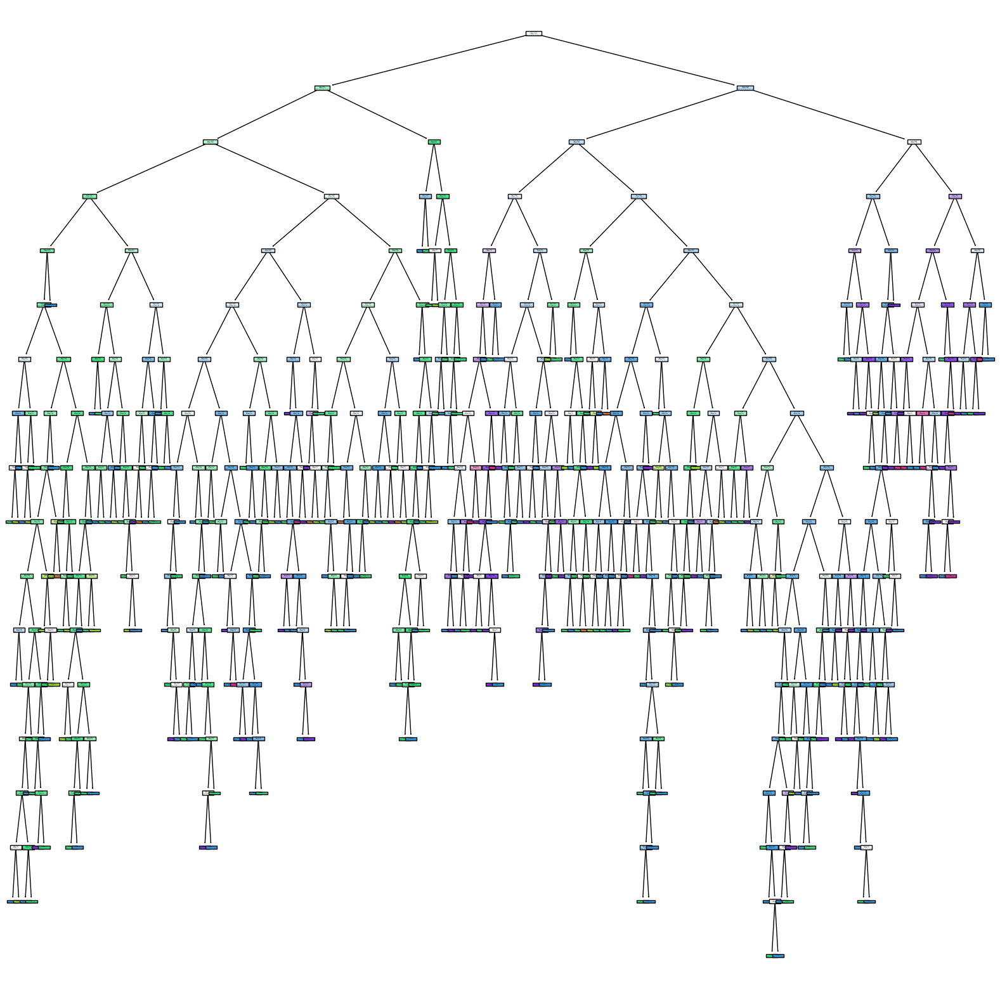

In [14]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt,filled=True)

In [15]:
df1 = df.head(500)

In [16]:
x1 = df1.drop(columns='quality')

In [17]:
y1 = df1.quality

In [18]:
dt.fit(x1,y1)

DecisionTreeClassifier()

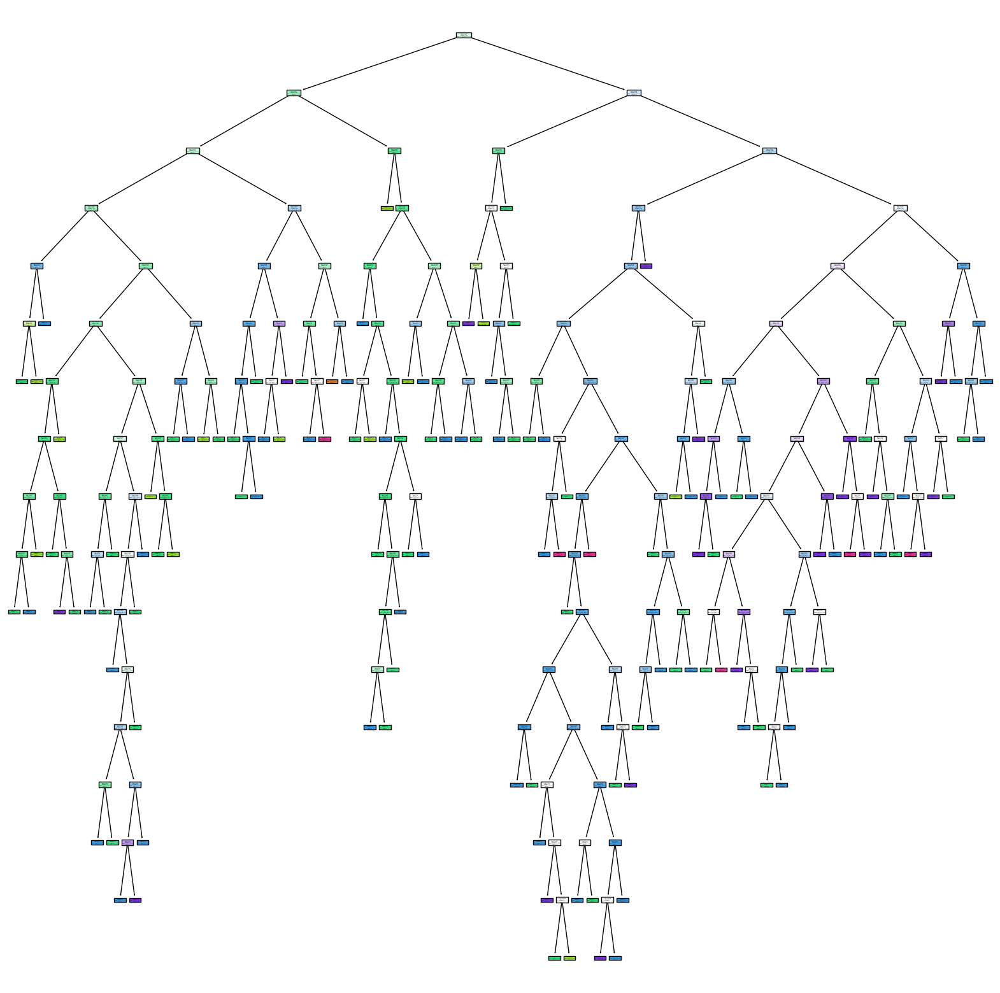

In [19]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt,filled=True, class_names= [str(i) for i in set(y1)])
plt.savefig('dt')

In [20]:
set(y1)

{3, 4, 5, 6, 7, 8}

In [21]:
path = dt.cost_complexity_pruning_path(x1,y1)

In [22]:
path

{'ccp_alphas': array([0.        , 0.00166667, 0.00175   , 0.00181818, 0.00184615,
        0.00188235, 0.00192308, 0.002     , 0.002     , 0.002     ,
        0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
        0.002     , 0.002     , 0.002     , 0.00203333, 0.00261111,
        0.00262769, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
        0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00271329,
        0.00272222, 0.003     , 0.003     , 0.003     , 0.003     ,
        0.00304762, 0.00305051, 0.00308418, 0.00325   , 0.00328205,
        0.00333333, 0.00333333, 0.00334032, 0.00336606, 0.00342857,
        0.00343316, 0.0035    , 0.0035    , 0.0036    , 0.00363636,
        0.00373333, 0.00373809, 0.0038    , 0.0038237 , 0.004     ,
        0.00404444, 0.00428571, 0.00437662, 0.00462338, 0.00465709,
        0.00466667, 0.0048    , 0.00495726, 0.00504242, 0.00508235,
        0.00509091, 0.00510606, 0.00516667, 0.00568485, 0.00589394,
        0.00656364, 0.00671079, 0.

In [23]:
ccp_alpha = path.ccp_alphas

In [24]:
ccp_alpha

array([0.        , 0.00166667, 0.00175   , 0.00181818, 0.00184615,
       0.00188235, 0.00192308, 0.002     , 0.002     , 0.002     ,
       0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
       0.002     , 0.002     , 0.002     , 0.00203333, 0.00261111,
       0.00262769, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
       0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00271329,
       0.00272222, 0.003     , 0.003     , 0.003     , 0.003     ,
       0.00304762, 0.00305051, 0.00308418, 0.00325   , 0.00328205,
       0.00333333, 0.00333333, 0.00334032, 0.00336606, 0.00342857,
       0.00343316, 0.0035    , 0.0035    , 0.0036    , 0.00363636,
       0.00373333, 0.00373809, 0.0038    , 0.0038237 , 0.004     ,
       0.00404444, 0.00428571, 0.00437662, 0.00462338, 0.00465709,
       0.00466667, 0.0048    , 0.00495726, 0.00504242, 0.00508235,
       0.00509091, 0.00510606, 0.00516667, 0.00568485, 0.00589394,
       0.00656364, 0.00671079, 0.0067591 , 0.00688352, 0.00688

In [25]:
dt_model = []
for ccp in ccp_alpha:
    dt_m = DecisionTreeClassifier(ccp_alpha=ccp)
    dt_m.fit(x1,y1)
    dt_model.append(dt_m)

In [26]:
dt_model

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.0016666666666666668),
 DecisionTreeClassifier(ccp_alpha=0.00175),
 DecisionTreeClassifier(ccp_alpha=0.0018181818181818184),
 DecisionTreeClassifier(ccp_alpha=0.0018461538461538455),
 DecisionTreeClassifier(ccp_alpha=0.001882352941176471),
 DecisionTreeClassifier(ccp_alpha=0.0019230769230769243),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002033333333333334),
 DecisionTreeClassifier(ccp_alpha=0.0026111111111111114),
 DecisionTreeClassifier(ccp_alpha=0.0026276923076923083),
 Deci

#### We select the best ccp_alpha value based on which model give the generalized model accuracy.

In [27]:
train_score = [i.score(x1,y1) for i in dt_model]

In [28]:
test_score = [i.score(x_test,y_test) for i in dt_model]

In [29]:
train_score

[1.0,
 1.0,
 0.996,
 0.996,
 0.992,
 0.986,
 0.988,
 0.962,
 0.96,
 0.96,
 0.966,
 0.962,
 0.964,
 0.966,
 0.964,
 0.962,
 0.96,
 0.962,
 0.964,
 0.95,
 0.948,
 0.928,
 0.932,
 0.93,
 0.93,
 0.932,
 0.93,
 0.932,
 0.932,
 0.93,
 0.926,
 0.916,
 0.916,
 0.912,
 0.918,
 0.916,
 0.914,
 0.91,
 0.91,
 0.904,
 0.898,
 0.902,
 0.9,
 0.892,
 0.888,
 0.89,
 0.882,
 0.88,
 0.878,
 0.876,
 0.878,
 0.874,
 0.866,
 0.858,
 0.856,
 0.858,
 0.846,
 0.852,
 0.848,
 0.824,
 0.818,
 0.814,
 0.81,
 0.804,
 0.802,
 0.794,
 0.79,
 0.786,
 0.784,
 0.78,
 0.776,
 0.776,
 0.772,
 0.768,
 0.762,
 0.758,
 0.742,
 0.728,
 0.718,
 0.698,
 0.69,
 0.682,
 0.676,
 0.676,
 0.636,
 0.596,
 0.596,
 0.596,
 0.596,
 0.478]

In [30]:
test_score

[0.578125,
 0.58125,
 0.584375,
 0.584375,
 0.603125,
 0.56875,
 0.60625,
 0.6,
 0.575,
 0.578125,
 0.584375,
 0.590625,
 0.5875,
 0.565625,
 0.5625,
 0.56875,
 0.575,
 0.578125,
 0.5875,
 0.60625,
 0.578125,
 0.6,
 0.590625,
 0.590625,
 0.596875,
 0.596875,
 0.596875,
 0.603125,
 0.603125,
 0.60625,
 0.584375,
 0.590625,
 0.596875,
 0.59375,
 0.578125,
 0.59375,
 0.578125,
 0.596875,
 0.58125,
 0.609375,
 0.5875,
 0.584375,
 0.590625,
 0.596875,
 0.609375,
 0.603125,
 0.59375,
 0.584375,
 0.596875,
 0.59375,
 0.596875,
 0.603125,
 0.596875,
 0.603125,
 0.590625,
 0.60625,
 0.584375,
 0.584375,
 0.609375,
 0.59375,
 0.590625,
 0.590625,
 0.596875,
 0.59375,
 0.59375,
 0.584375,
 0.58125,
 0.58125,
 0.571875,
 0.578125,
 0.56875,
 0.56875,
 0.56875,
 0.5625,
 0.575,
 0.571875,
 0.565625,
 0.5625,
 0.56875,
 0.55,
 0.5625,
 0.5625,
 0.553125,
 0.553125,
 0.528125,
 0.553125,
 0.553125,
 0.553125,
 0.553125,
 0.41875]

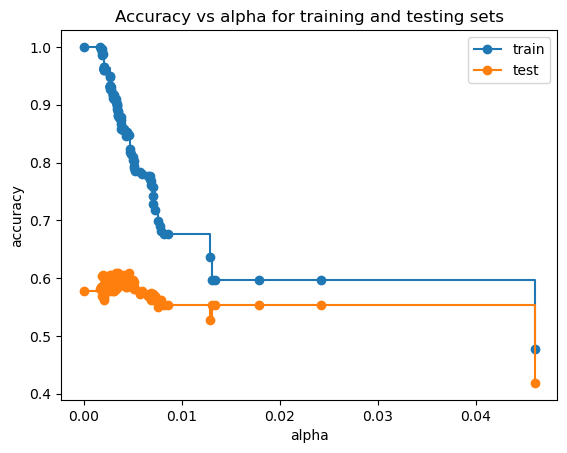

In [31]:
fig,ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alpha,train_score,marker='o',label="train",drawstyle="steps-post")
ax.plot(ccp_alpha,test_score,marker='o',label="test",drawstyle="steps-post")
ax.legend()
plt.show()

In [32]:
dt_model_alpha = DecisionTreeClassifier(random_state=0,ccp_alpha=0.024)

In [33]:
dt_model_alpha.fit(x1,y1)

DecisionTreeClassifier(ccp_alpha=0.024, random_state=0)

[Text(0.4, 0.8333333333333334, 'X[10] <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]'),
 Text(0.2, 0.5, 'gini = 0.504\nsamples = 259\nvalue = [1, 12, 167, 72, 6, 1]'),
 Text(0.6, 0.5, 'X[9] <= 0.545\ngini = 0.657\nsamples = 241\nvalue = [0, 4, 72, 112, 46, 7]'),
 Text(0.4, 0.16666666666666666, 'gini = 0.408\nsamples = 32\nvalue = [0, 2, 24, 5, 1, 0]'),
 Text(0.8, 0.16666666666666666, 'gini = 0.638\nsamples = 209\nvalue = [0, 2, 48, 107, 45, 7]')]

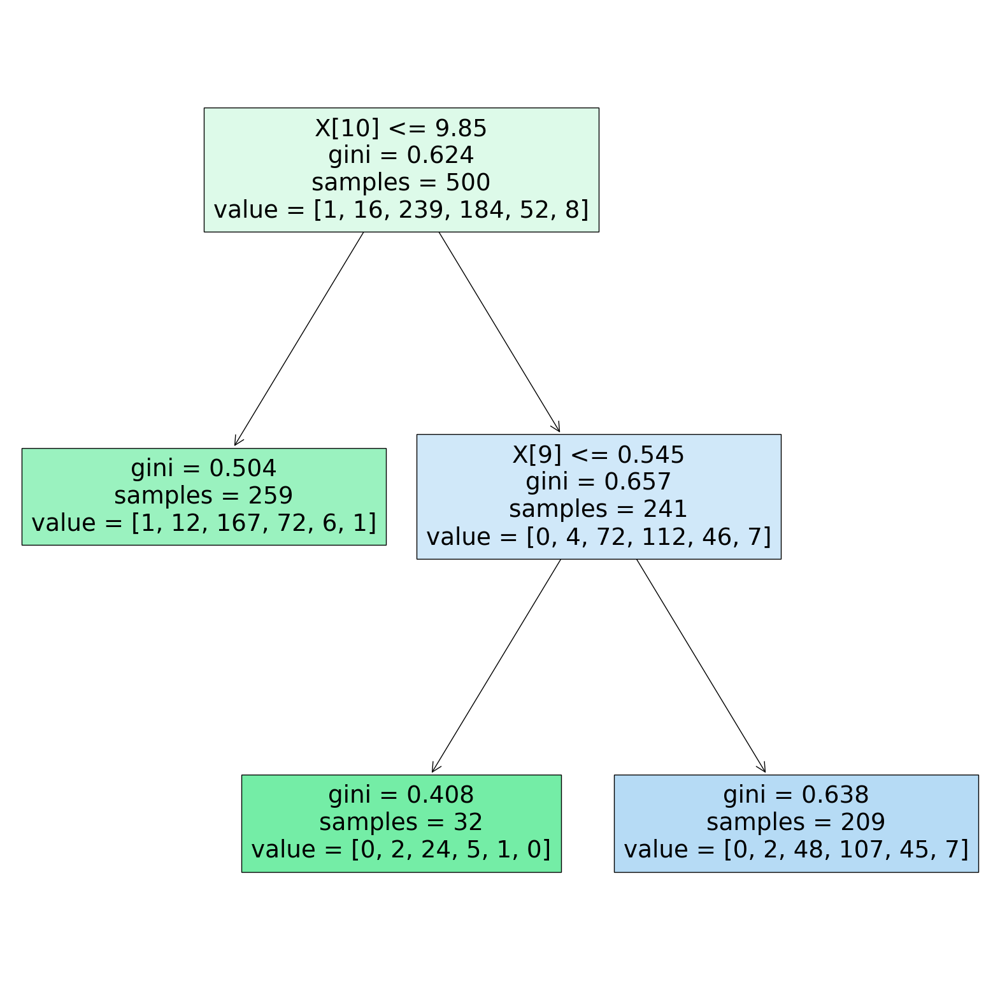

In [34]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_alpha,filled=True)

In [35]:
dt_model_alpha.score(x1,y1)

0.596

In [36]:
dt_model_alpha.score(x_test,y_test)

0.553125

#### Let's do the Hyperparameter tuning

In [37]:
parameters = {"criterion":["gini", "entropy", "log_loss"],
            "splitter":["best", "random"],
            "max_depth":range(1,10,1),
            "min_samples_split":range(1,10,1),
            "min_samples_leaf":range(1,10,1)}

In [38]:
new_model = GridSearchCV(estimator=dt_model_alpha,param_grid=parameters,cv=5,verbose=3)

In [41]:
new_model.fit(x1,y1)

Fitting 5 folds for each of 4374 candidates, totalling 21870 fits
[CV 1/5] END criterion=gini, max_depth=1, min_samples_leaf=1, min_samples_split=1, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=1, min_samples_leaf=1, min_samples_split=1, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=1, min_samples_leaf=1, min_samples_split=1, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=1, min_samples_leaf=1, min_samples_split=1, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=1, min_samples_leaf=1, min_samples_split=1, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=1, min_samples_leaf=1, min_samples_split=1, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=1, min_samples_leaf=1, min_samples_split=1, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_d

c:\Users\mdqua\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:676: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


[CV 4/5] END criterion=gini, max_depth=1, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.530 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=1, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.470 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=1, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.480 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=1, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.480 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=1, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.560 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=1, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.530 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=1, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.480 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=1, min_samples_leaf=1, min_samples_split=6, spl

c:\Users\mdqua\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
8910 fits failed out of a total of 21870.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2430 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\mdqua\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\mdqua\anaconda3\lib\site-packages\sklearn\tree\_classes.py", line 937, in fit
    super().fit(
  File "c:\Users\mdqua\anaconda3\lib\site-packages\sklearn\tree\_classes.py", line 250, in fit
    raise ValueError(
ValueError: min_samples_split must be an integer greater than 1 or a float

GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(ccp_alpha=0.024, random_state=0),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': range(1, 10),
                         'min_samples_leaf': range(1, 10),
                         'min_samples_split': range(1, 10),
                         'splitter': ['best', 'random']},
             verbose=3)

In [42]:
new_model.best_params_

{'criterion': 'entropy',
 'max_depth': 7,
 'min_samples_leaf': 2,
 'min_samples_split': 6,
 'splitter': 'random'}

In [43]:
new_model = DecisionTreeClassifier(criterion="entropy",max_depth=7,min_samples_leaf=2,min_samples_split=6,splitter="random")

In [44]:
new_model.fit(x1,y1)

DecisionTreeClassifier(criterion='entropy', max_depth=7, min_samples_leaf=2,
                       min_samples_split=6, splitter='random')

In [45]:
new_model.score(x1,y1)

0.736

In [46]:
new_model.score(x_test,y_test)

0.54375

In [48]:
y_pred = new_model.predict(x_test)

In [49]:
accuracy_score(y_pred, y_test)

0.54375

In [50]:
new_model.score(x_train,y_train)

0.5590304925723222